##GAN&CLIP - WITH CALLBACKS

See how the model is training...

Overview:
This notebook is handling the pipeline of 


Authors: Maciej Domagała, Adam Komorowski

### GENERATING IMAGES

In [1]:
#@title Initialization (Installation, Imports) - check github branch!
%%capture
import subprocess
import re

nvcc = subprocess.check_output(["nvcc", "--version"]).decode("utf-8")
version = re.findall("release (\d+\.\d+)", nvcc)[0]

pytorch_suffix = {
    "10.0": "+cu100",
    "10.1": "+cu101",
    "10.2": "",
}

pytorch_version = "1.7.1" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")
torchvision_version = "0.8.2" + (pytorch_suffix[version] if version in pytorch_suffix else "+cu110")

!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt #imagenet_classes

!git clone https://github.com/maciejdomagala/clip_gans.git
%cd clip_gans
!git checkout main ### WARNING!!!

try:
  import torch
except:
  !pip install torch=={pytorch_version} -f https://download.pytorch.org/whl/torch_stable.html

try:
  import torchvision
except:
  !pip install torchvision=={torchvision_version} -f https://download.pytorch.org/whl/torch_stable.html

!pip install pytorch_pretrained_biggan pymoo kornia ftfy tensorboard

# IMPORTS
import warnings

import argparse
import os
import torch
import numpy as np
import pickle
import math
from tqdm import tqdm_notebook
from pymoo.optimize import minimize
from pymoo.algorithms.so_genetic_algorithm import GA
from pymoo.factory import get_algorithm, get_decision_making, get_decomposition
from pymoo.visualization.scatter import Scatter
import torchvision
from IPython.display import Image, display
import urllib.request
import cv2

from config import get_config
from problem import GenerationProblem
from operators import get_operators
from operators import get_algo


warnings.filterwarnings('ignore')

In [7]:
#@title Input Parameters
target = "a big lion in the ocean" #@param {type:"string"}
config = "DeepMindBigGAN256_de" #@param ["DeepMindBigGAN256_ga","DeepMindBigGAN256_de", "StyleGAN2_ffhq_ga","StyleGAN2_ffhq_de", "StyleGAN2_car_ga", "StyleGAN2_car_de","StyleGAN2_church_ga", "StyleGAN2_church_de","StyleGAN2_cat_ga", "StyleGAN2_cat_de"]
generations =   200#@param {type:"number"}
callbacks_each =  10 #@param {type: "number"}
population_size =  64#@param {type:"number"}
#number_of_loops =  1 #@param {type:"number"}
# algorithm_param = 'ga' #@param ['ga', 'de']

In [8]:
#@title Download weights for given model
!chmod +x ./download-weights.sh
if "ffhq" in config:
  ! ./download-weights.sh StyleGAN2-ffhq
if "church" in config:
  ! ./download-weights.sh StyleGAN2-church
if "car" in config:
  ! ./download-weights.sh StyleGAN2-car
if "cat" in config:
  ! ./download-weights.sh StyleGAN2-cat

In [9]:
#@title Config 
config = argparse.Namespace(
    config=config,
    target=target,
    device="cuda",
    generations=generations,
    tmp_folder="./results"
)
vars(config).update(get_config(config.config))
config.pop_size = population_size
# config.algorithm = algorithm_param
config.generations = generations
config.callbacks_each = callbacks_each

if not os.path.exists(config.tmp_folder): os.mkdir(config.tmp_folder)
if not os.path.exists(f'{config.tmp_folder}/{config.target}'): os.mkdir(f'{config.tmp_folder}/{config.target}')


In [10]:
#@title Support methods
def callback(algorithm):
    global config, iteration, loop, target

    iteration += 1

    sortedpop = sorted(algorithm.pop, key=lambda p: p.F)
    X = np.stack([p.X for p in sortedpop])      
    ls = config.latent(config)
    ls.set_from_population(X)
    if (iteration%config.callbacks_each == 0) or (iteration==config.generations):
      with torch.no_grad():
        generated = algorithm.problem.generator.generate(ls)
        name = f'batch_iteration_{iteration}.jpg'
        algorithm.problem.generator.save(generated, f"./{config.tmp_folder}/{config.target}/{name}")
        print(f'After {iteration} iterations...')
        display(Image(f"./{config.tmp_folder}/{config.target}/{name}"))

def generate_image(loop: int):
  problem = GenerationProblem(config)

  kwargs = get_algo(config)

  algorithm = get_algorithm(
      config.algorithm,
      callback=callback,
      **kwargs
  )

  res = minimize(
      problem,
      algorithm,
      ("n_gen", config.generations),
      save_history=False,
      verbose=True,
  )


  X = np.atleast_2d(res.X)
  ls = config.latent(config)
  ls.set_from_population(X)

  with torch.no_grad():
      generated = problem.generator.generate(ls)
  print(f'Final image for "{config.target}" target.')
  problem.generator.save(generated, f"./{config.tmp_folder}/{config.target}/final.jpg")
  display(Image(f"./{config.tmp_folder}/{config.target}/final.jpg"))

n_gen |  n_eval |   cv (min)   |   cv (avg)   |     fopt     |     favg    
    1 |      64 |  0.00000E+00 |  0.00000E+00 |      -0.2422 |      -0.1958
    2 |     128 |  0.00000E+00 |  0.00000E+00 |      -0.2422 |      -0.2039
    3 |     192 |  0.00000E+00 |  0.00000E+00 |      -0.2422 |      -0.2095
    4 |     256 |  0.00000E+00 |  0.00000E+00 |      -0.2593 |      -0.2146
    5 |     320 |  0.00000E+00 |  0.00000E+00 |       -0.266 |       -0.217
    6 |     384 |  0.00000E+00 |  0.00000E+00 |       -0.266 |      -0.2201
    7 |     448 |  0.00000E+00 |  0.00000E+00 |       -0.266 |      -0.2228
    8 |     512 |  0.00000E+00 |  0.00000E+00 |       -0.266 |      -0.2268
    9 |     576 |  0.00000E+00 |  0.00000E+00 |       -0.266 |      -0.2295
   10 |     640 |  0.00000E+00 |  0.00000E+00 |       -0.266 |      -0.2305
After 10 iterations...


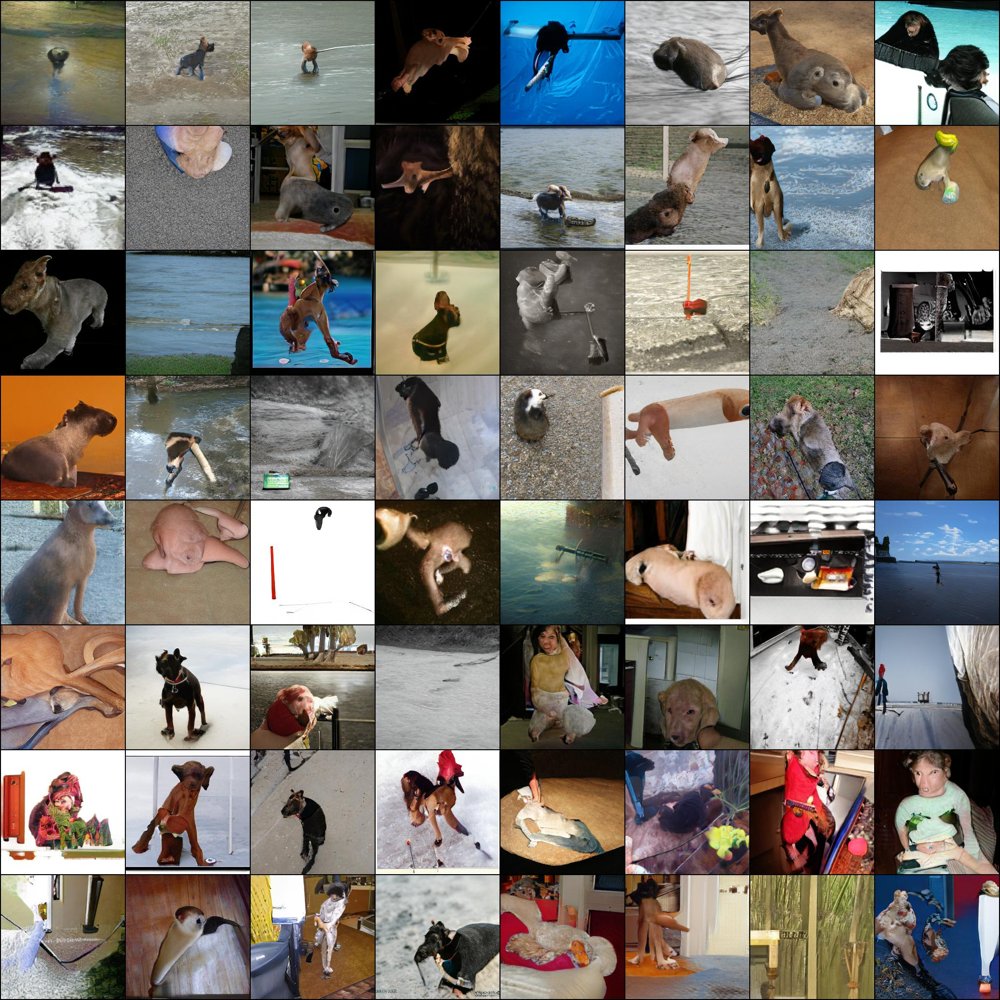

   11 |     704 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2334
   12 |     768 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2346
   13 |     832 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2366
   14 |     896 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2377
   15 |     960 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2385
   16 |    1024 |  0.00000E+00 |  0.00000E+00 |      -0.2722 |      -0.2402
   17 |    1088 |  0.00000E+00 |  0.00000E+00 |      -0.2776 |      -0.2415
   18 |    1152 |  0.00000E+00 |  0.00000E+00 |      -0.2776 |      -0.2429
   19 |    1216 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2465
   20 |    1280 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2479
After 20 iterations...


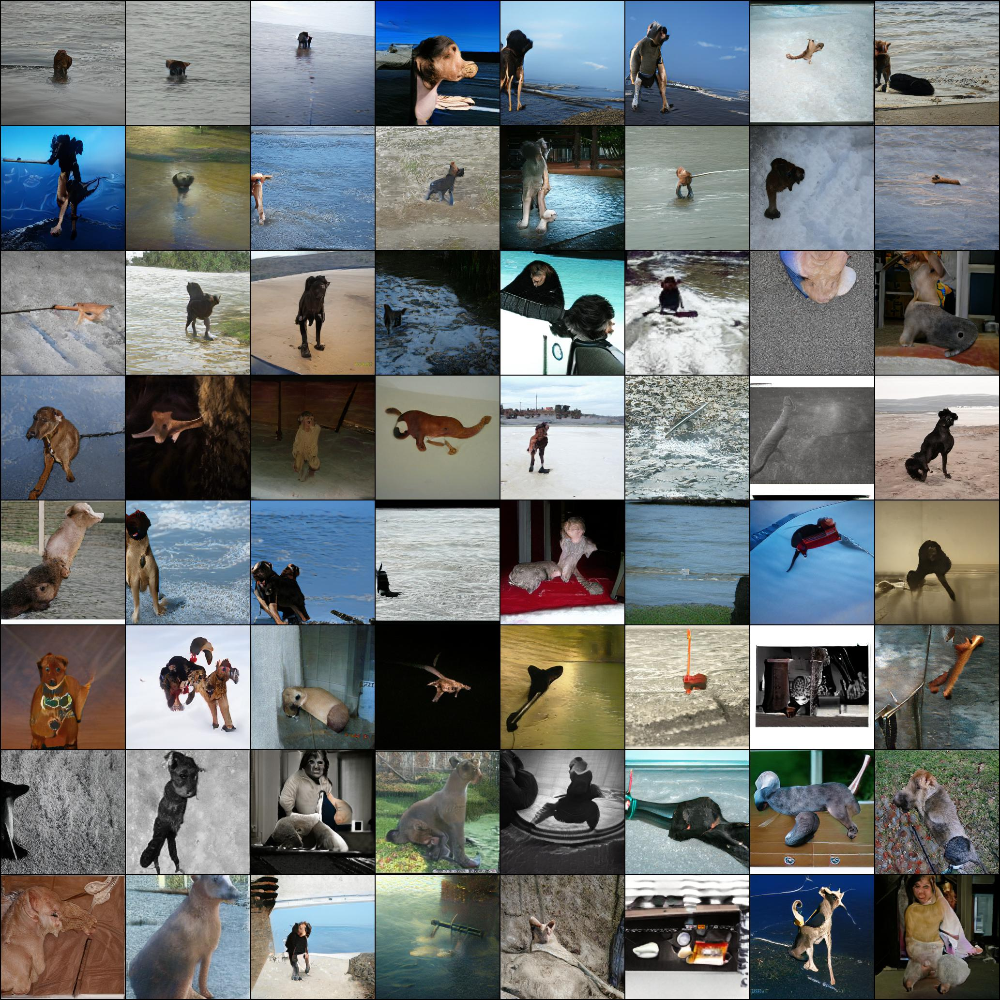

   21 |    1344 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2499
   22 |    1408 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2502
   23 |    1472 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2527
   24 |    1536 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2544
   25 |    1600 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2566
   26 |    1664 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |      -0.2585
   27 |    1728 |  0.00000E+00 |  0.00000E+00 |      -0.3025 |       -0.261
   28 |    1792 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2625
   29 |    1856 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2632
   30 |    1920 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.264
After 30 iterations...


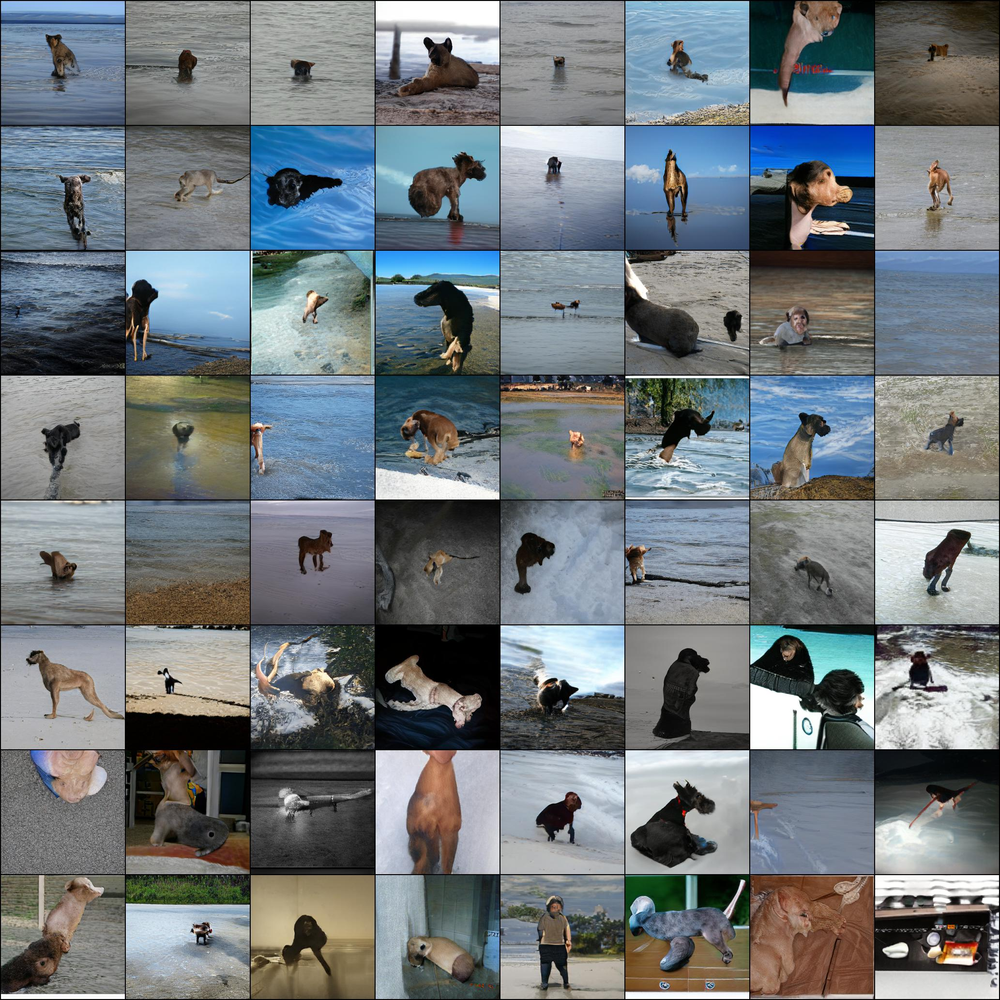

   31 |    1984 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2659
   32 |    2048 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.267
   33 |    2112 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2683
   34 |    2176 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2698
   35 |    2240 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.271
   36 |    2304 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2715
   37 |    2368 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2725
   38 |    2432 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2734
   39 |    2496 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2744
   40 |    2560 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2756
After 40 iterations...


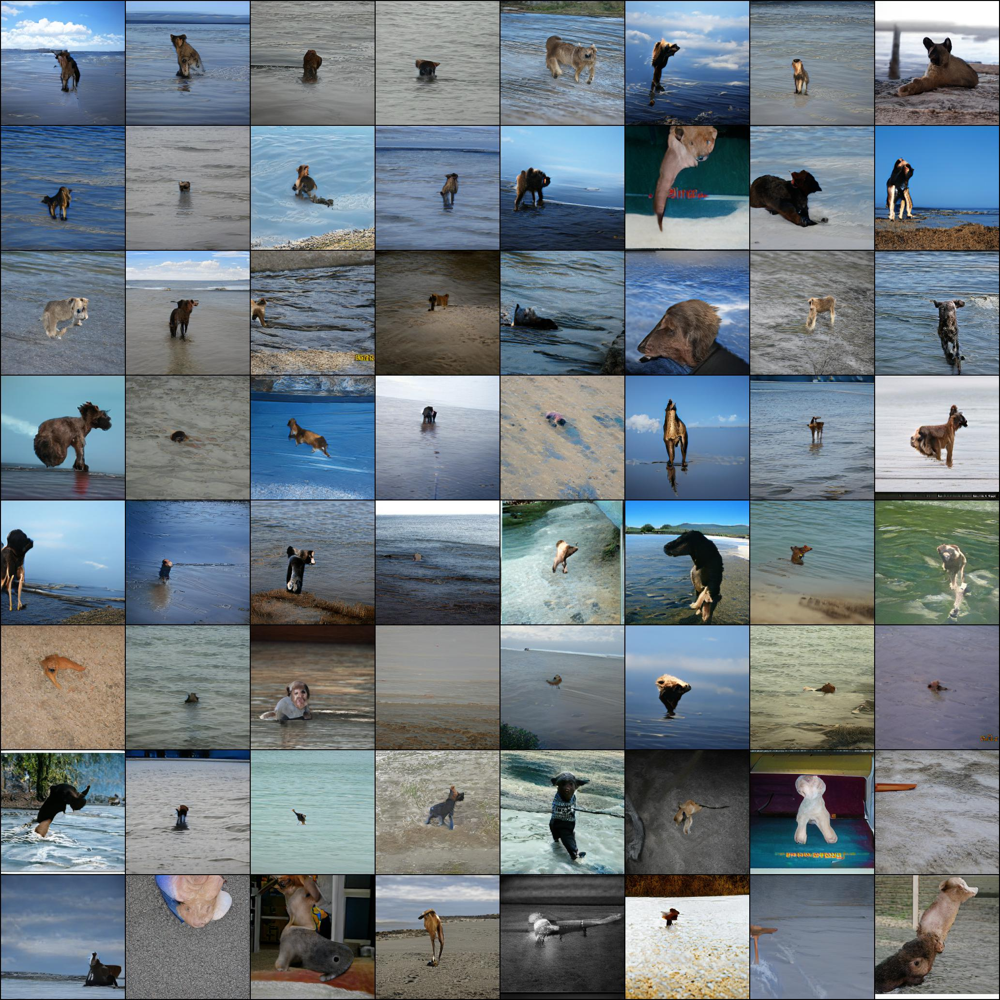

   41 |    2624 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.277
   42 |    2688 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.278
   43 |    2752 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2788
   44 |    2816 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2793
   45 |    2880 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2822
   46 |    2944 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |      -0.2832
   47 |    3008 |  0.00000E+00 |  0.00000E+00 |      -0.3074 |       -0.284
   48 |    3072 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |       -0.285
   49 |    3136 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |       -0.285
   50 |    3200 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2856
After 50 iterations...


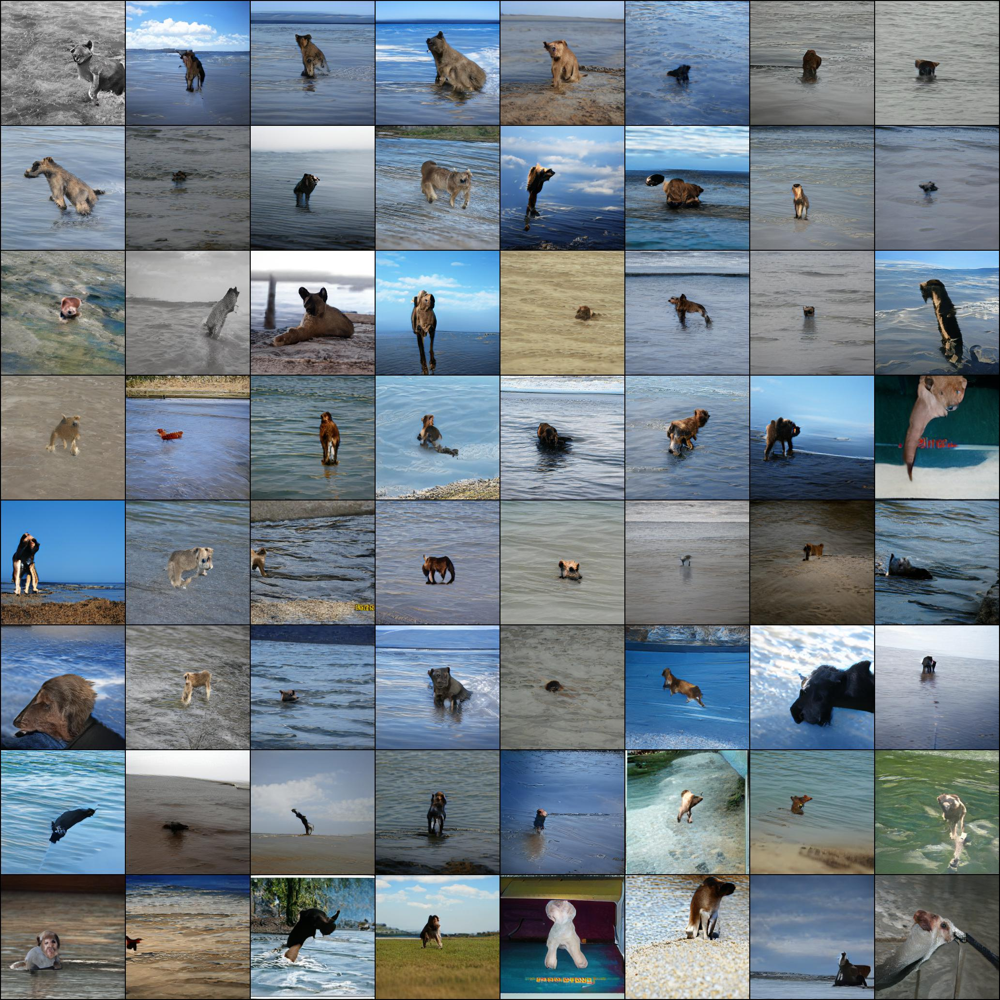

   51 |    3264 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2856
   52 |    3328 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2869
   53 |    3392 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2874
   54 |    3456 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2876
   55 |    3520 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2896
   56 |    3584 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2903
   57 |    3648 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2905
   58 |    3712 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2913
   59 |    3776 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2917
   60 |    3840 |  0.00000E+00 |  0.00000E+00 |      -0.3093 |      -0.2927
After 60 iterations...


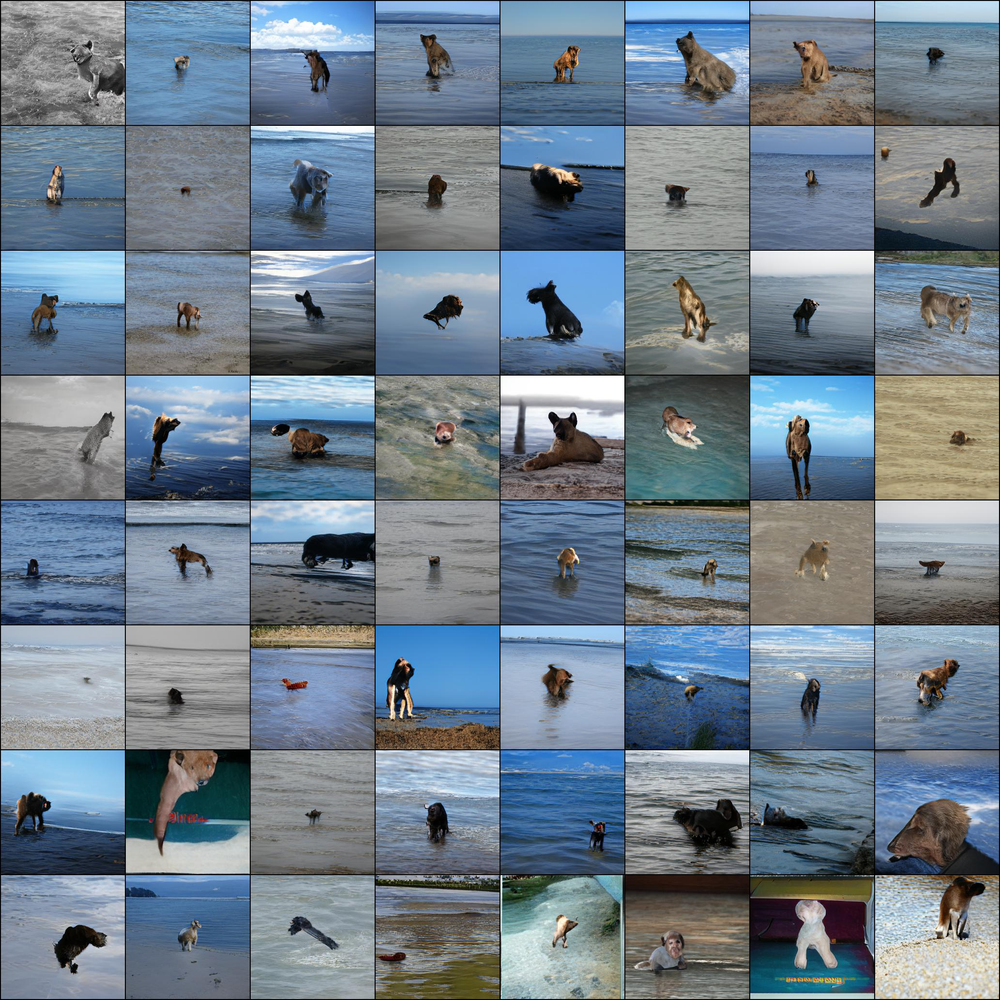

   61 |    3904 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2932
   62 |    3968 |  0.00000E+00 |  0.00000E+00 |      -0.3123 |      -0.2935
   63 |    4032 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2944
   64 |    4096 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2947
   65 |    4160 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |       -0.295
   66 |    4224 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2952
   67 |    4288 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2952
   68 |    4352 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |       -0.296
   69 |    4416 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2961
   70 |    4480 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2969
After 70 iterations...


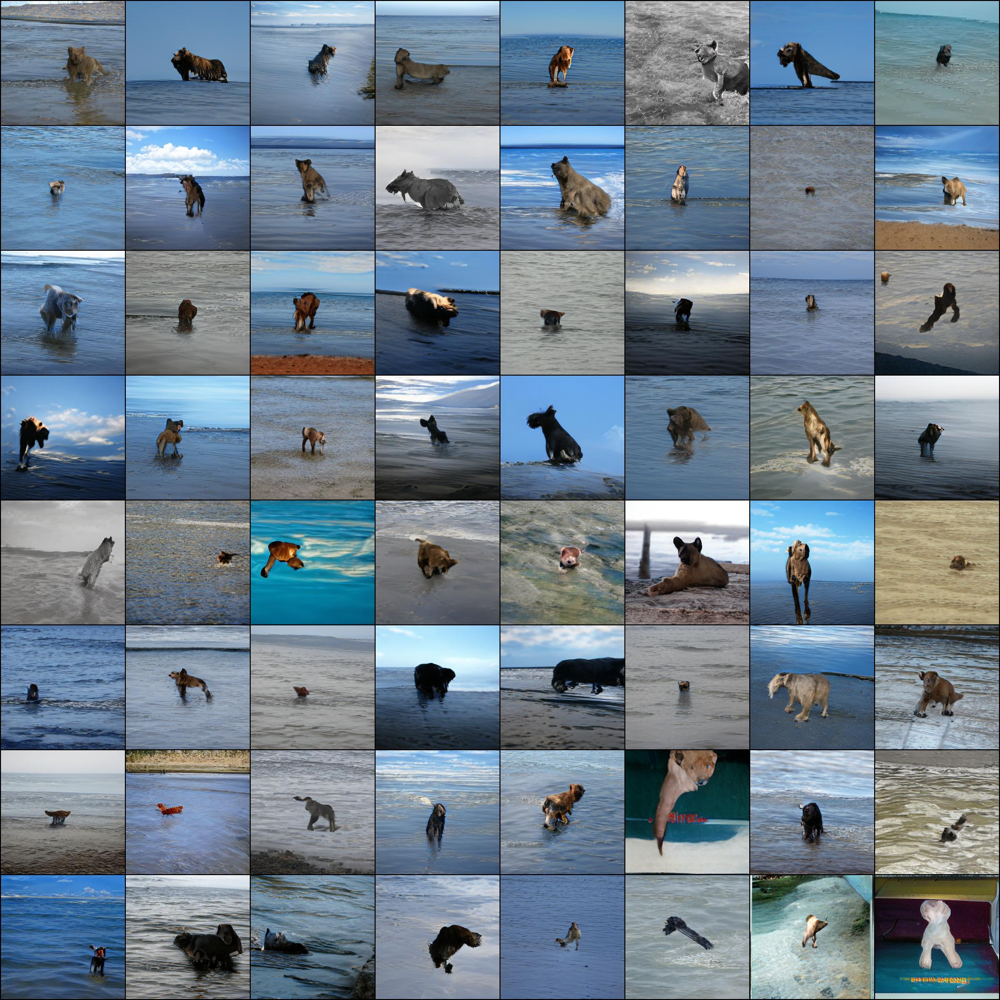

   71 |    4544 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2974
   72 |    4608 |  0.00000E+00 |  0.00000E+00 |      -0.3289 |      -0.2976
   73 |    4672 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.2986
   74 |    4736 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.2986
   75 |    4800 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.2988
   76 |    4864 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.299
   77 |    4928 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.299
   78 |    4992 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.2993
   79 |    5056 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3003
   80 |    5120 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3003
After 80 iterations...


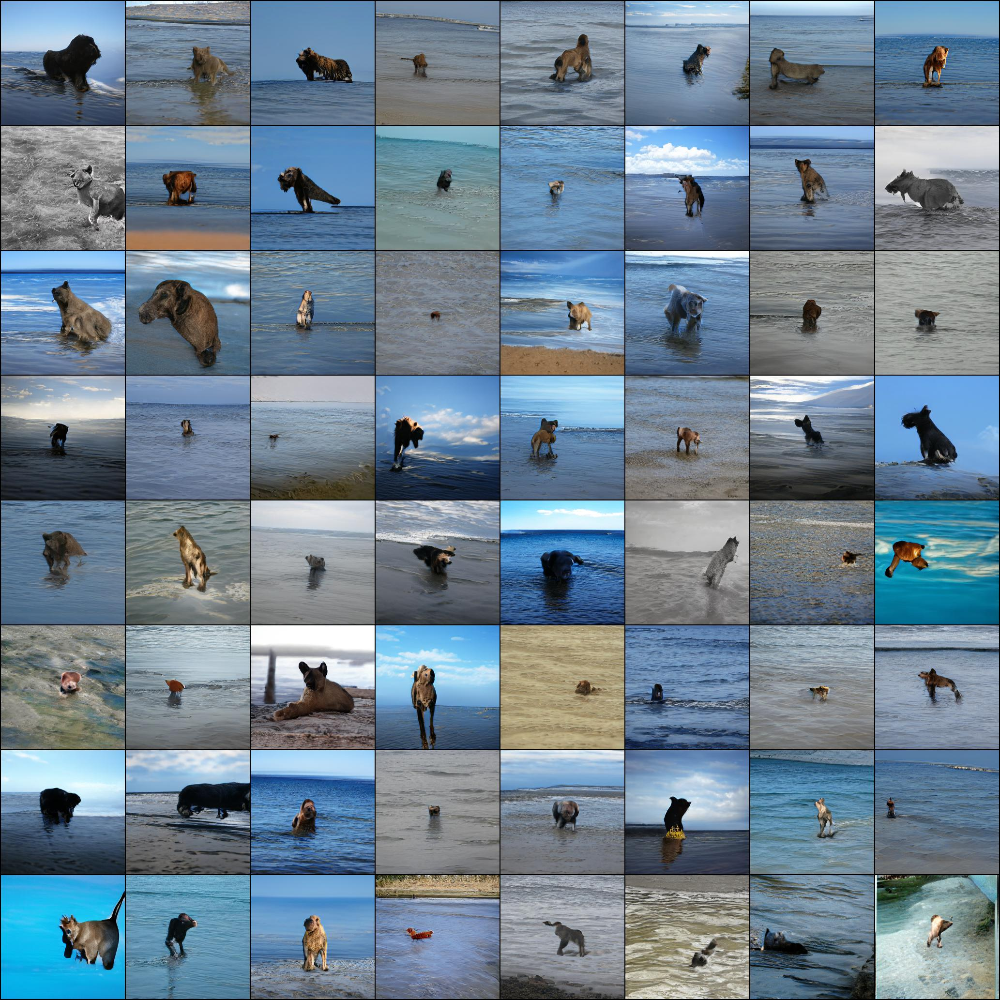

   81 |    5184 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3005
   82 |    5248 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.301
   83 |    5312 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.301
   84 |    5376 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.302
   85 |    5440 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.302
   86 |    5504 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.302
   87 |    5568 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3022
   88 |    5632 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3027
   89 |    5696 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.303
   90 |    5760 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.303
After 90 iterations...


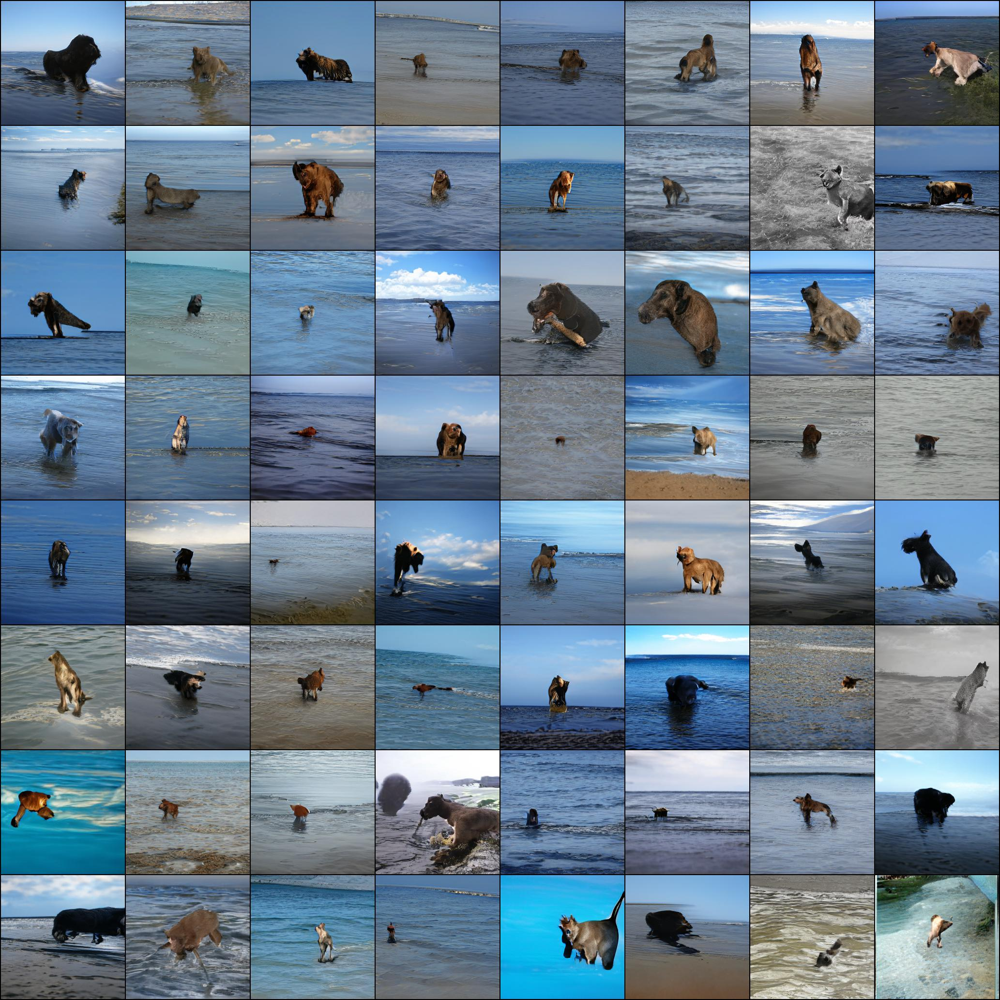

   91 |    5824 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.303
   92 |    5888 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3035
   93 |    5952 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3037
   94 |    6016 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3037
   95 |    6080 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3047
   96 |    6144 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.305
   97 |    6208 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3052
   98 |    6272 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.306
   99 |    6336 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3062
  100 |    6400 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3064
After 100 iterations...


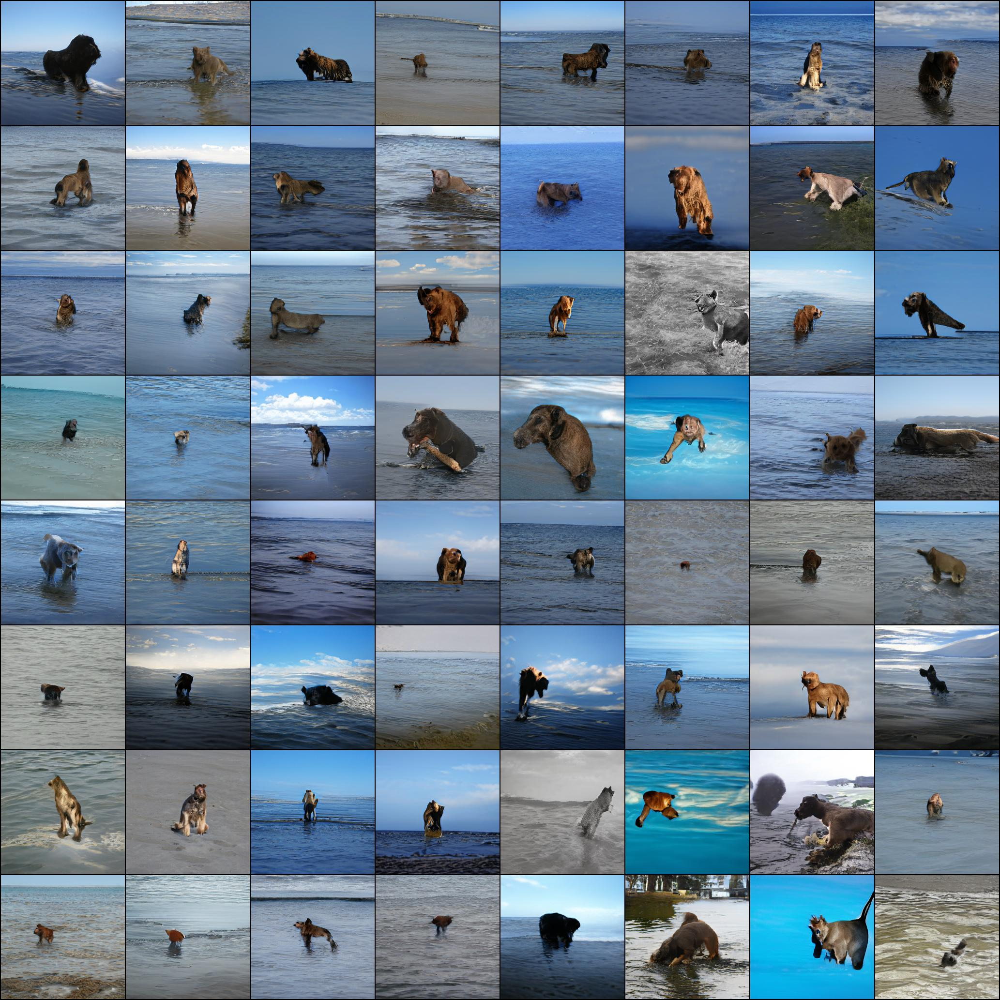

  101 |    6464 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3064
  102 |    6528 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3064
  103 |    6592 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3064
  104 |    6656 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3066
  105 |    6720 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3066
  106 |    6784 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3066
  107 |    6848 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.307
  108 |    6912 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3071
  109 |    6976 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3074
  110 |    7040 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3074
After 110 iterations...


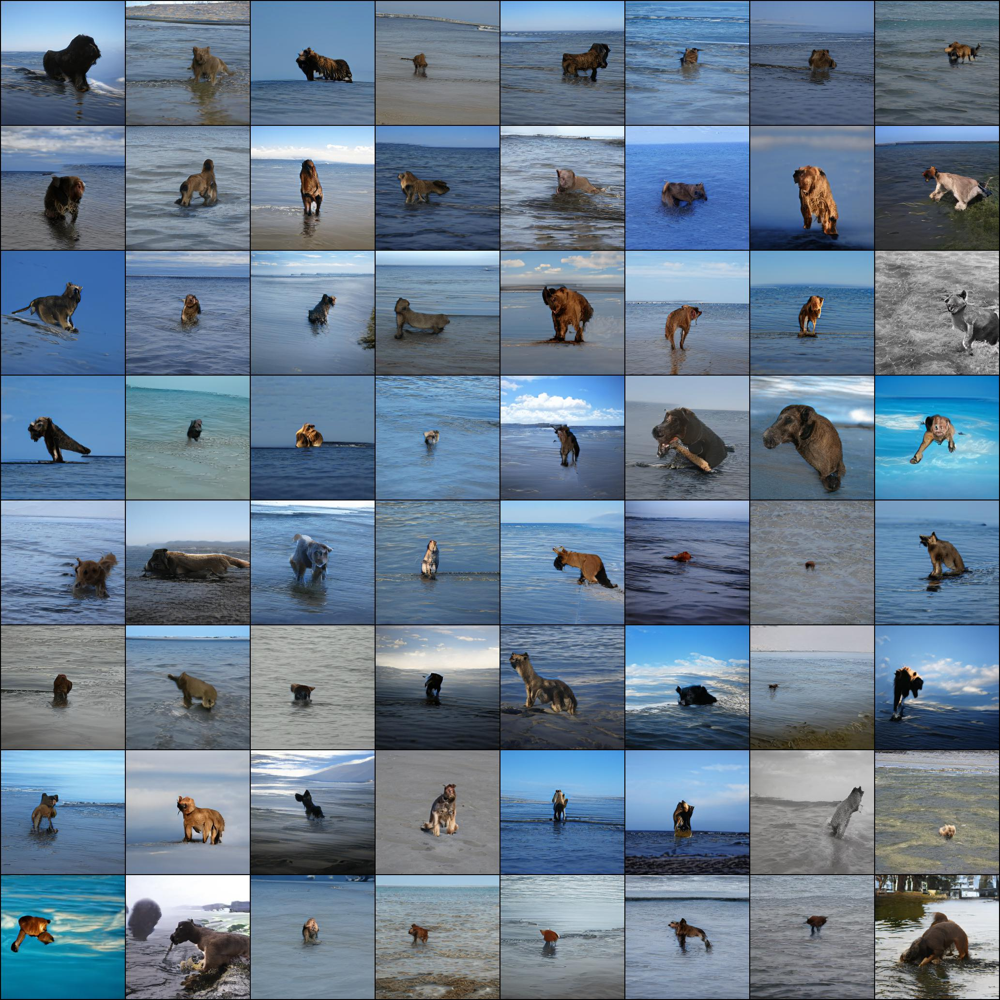

  111 |    7104 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3074
  112 |    7168 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3076
  113 |    7232 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3076
  114 |    7296 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3079
  115 |    7360 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3079
  116 |    7424 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3079
  117 |    7488 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.308
  118 |    7552 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.308
  119 |    7616 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3088
  120 |    7680 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3088
After 120 iterations...


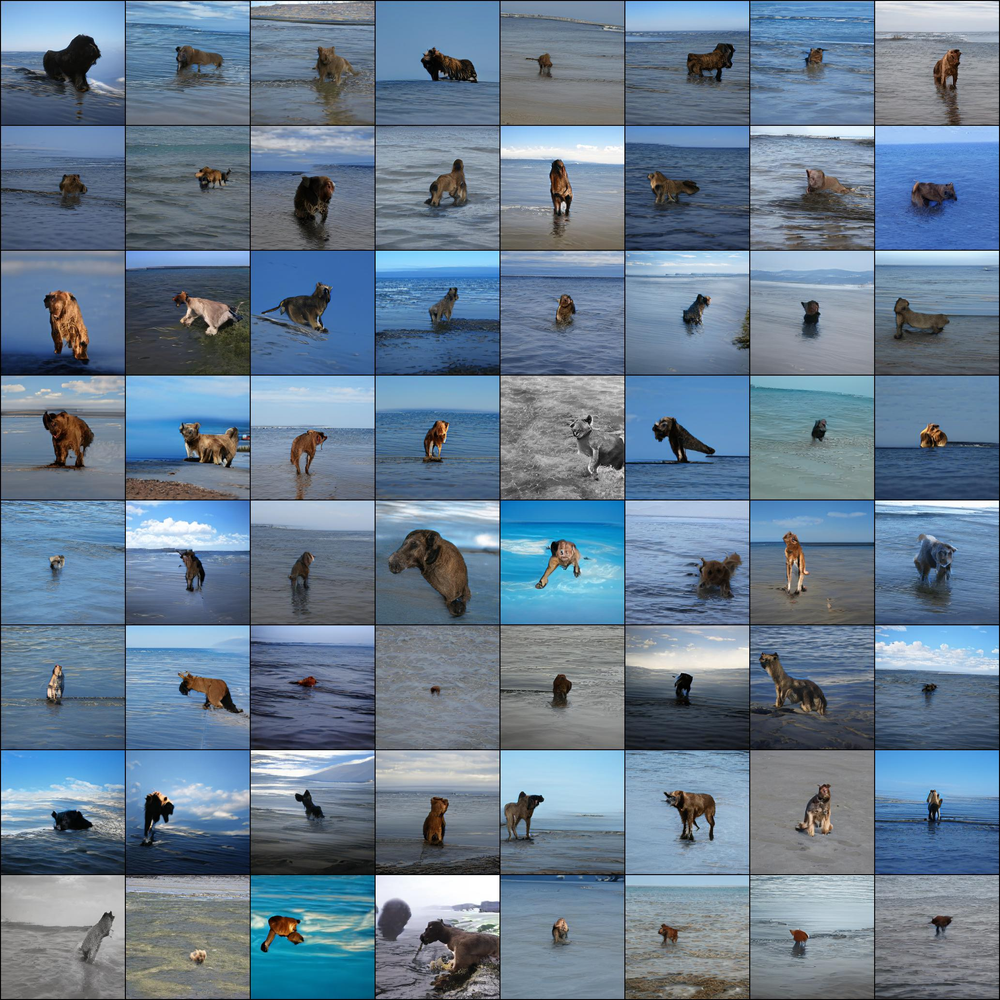

  121 |    7744 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3088
  122 |    7808 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.309
  123 |    7872 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3093
  124 |    7936 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3096
  125 |    8000 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3096
  126 |    8064 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3098
  127 |    8128 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3098
  128 |    8192 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |        -0.31
  129 |    8256 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |        -0.31
  130 |    8320 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3103
After 130 iterations...


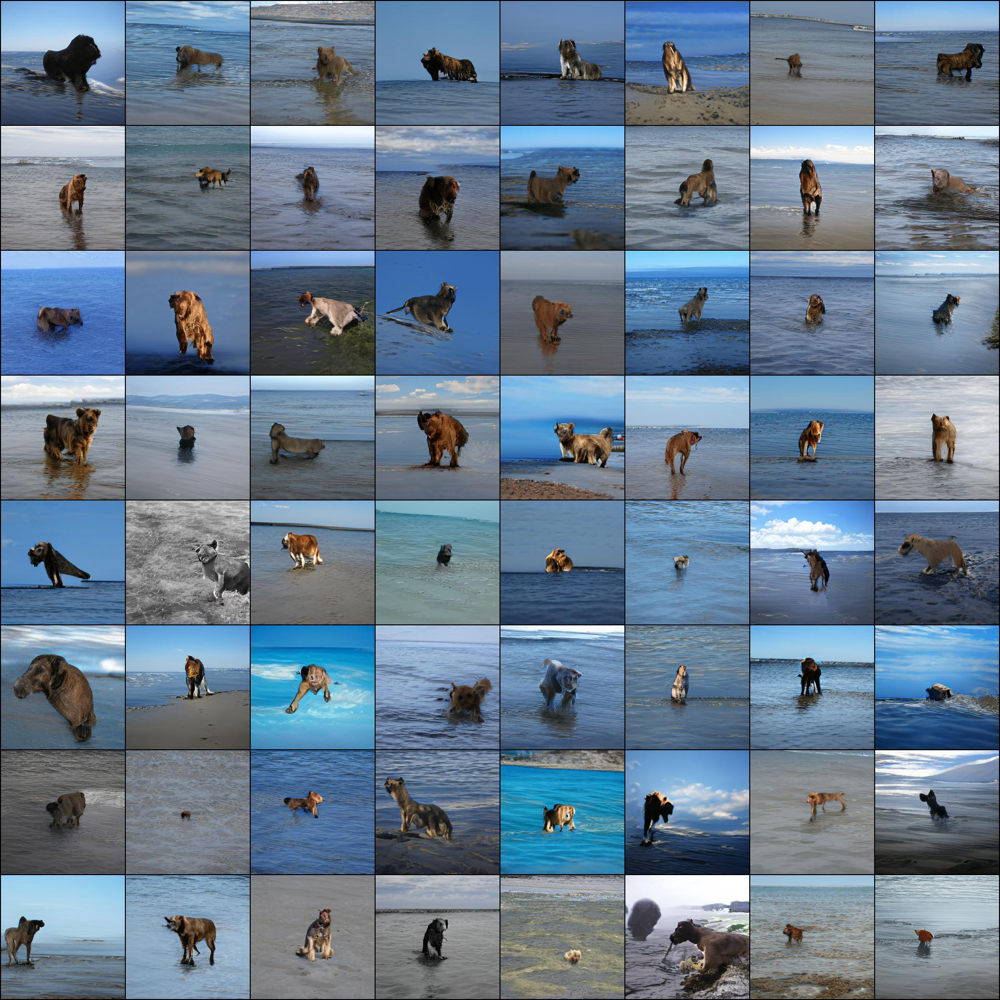

  131 |    8384 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3108
  132 |    8448 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3108
  133 |    8512 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3108
  134 |    8576 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.311
  135 |    8640 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3113
  136 |    8704 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3113
  137 |    8768 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3118
  138 |    8832 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.312
  139 |    8896 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3123
  140 |    8960 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3125
After 140 iterations...


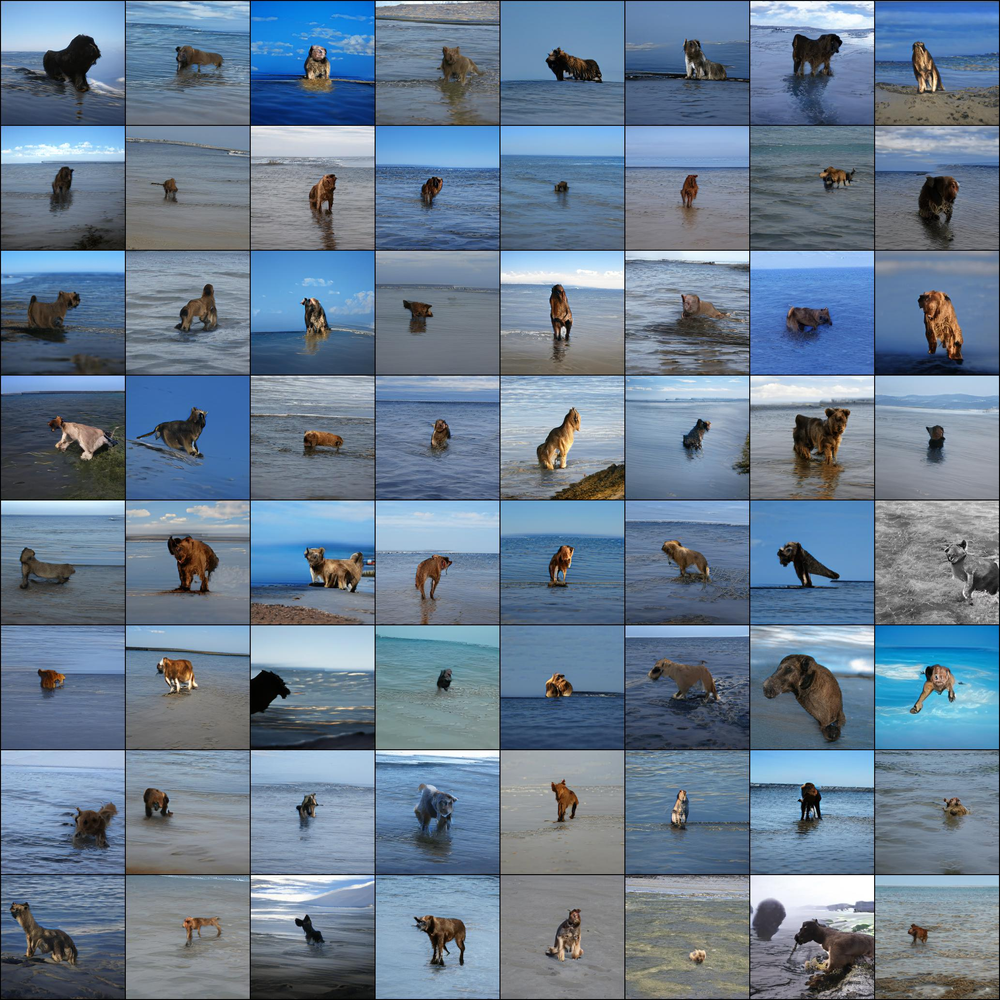

  141 |    9024 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3125
  142 |    9088 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3127
  143 |    9152 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.313
  144 |    9216 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.313
  145 |    9280 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3132
  146 |    9344 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3135
  147 |    9408 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3137
  148 |    9472 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3137
  149 |    9536 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3137
  150 |    9600 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.314
After 150 iterations...


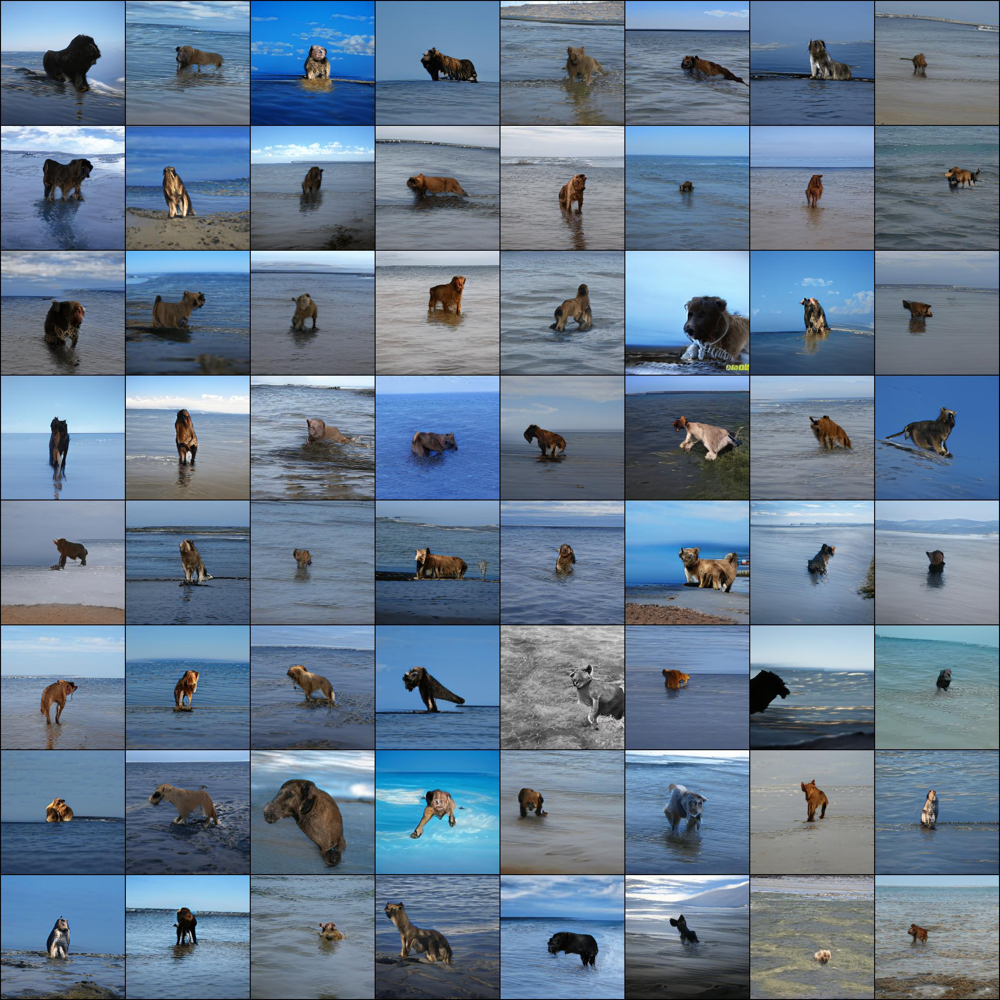

  151 |    9664 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.314
  152 |    9728 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3142
  153 |    9792 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3145
  154 |    9856 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3145
  155 |    9920 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3145
  156 |    9984 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3145
  157 |   10048 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3147
  158 |   10112 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3152
  159 |   10176 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3152
  160 |   10240 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3152
After 160 iterations...


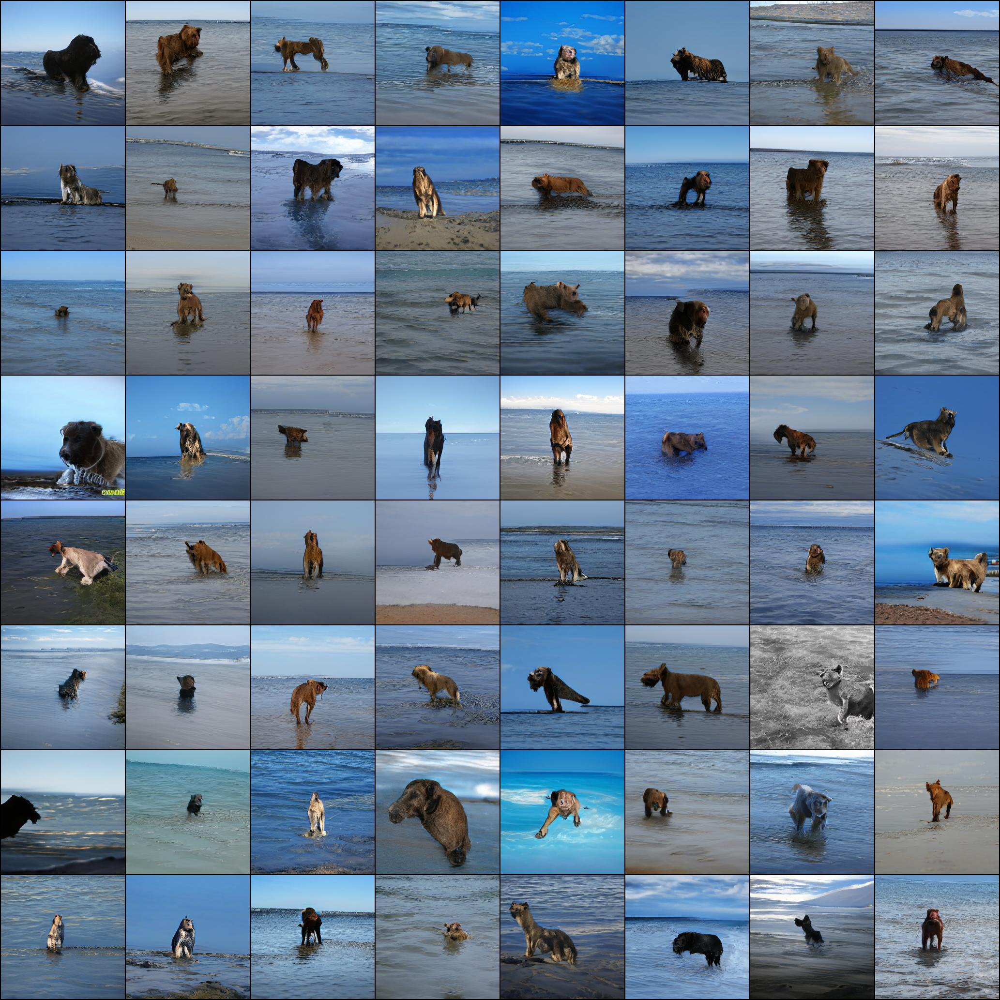

  161 |   10304 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3154
  162 |   10368 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3154
  163 |   10432 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.316
  164 |   10496 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3162
  165 |   10560 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3164
  166 |   10624 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3164
  167 |   10688 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3164
  168 |   10752 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.317
  169 |   10816 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3171
  170 |   10880 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3174
After 170 iterations...


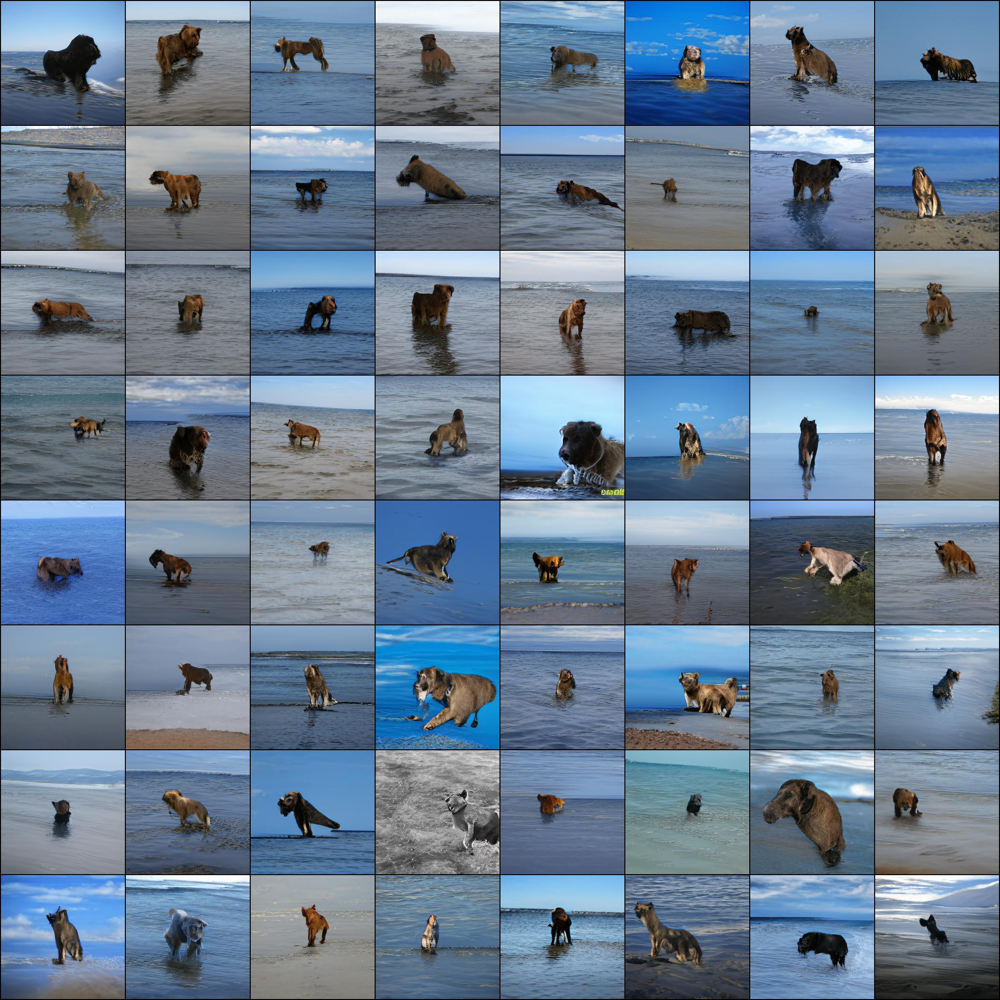

  171 |   10944 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3174
  172 |   11008 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3174
  173 |   11072 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3176
  174 |   11136 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3179
  175 |   11200 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3179
  176 |   11264 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3179
  177 |   11328 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3179
  178 |   11392 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
  179 |   11456 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
  180 |   11520 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
After 180 iterations...


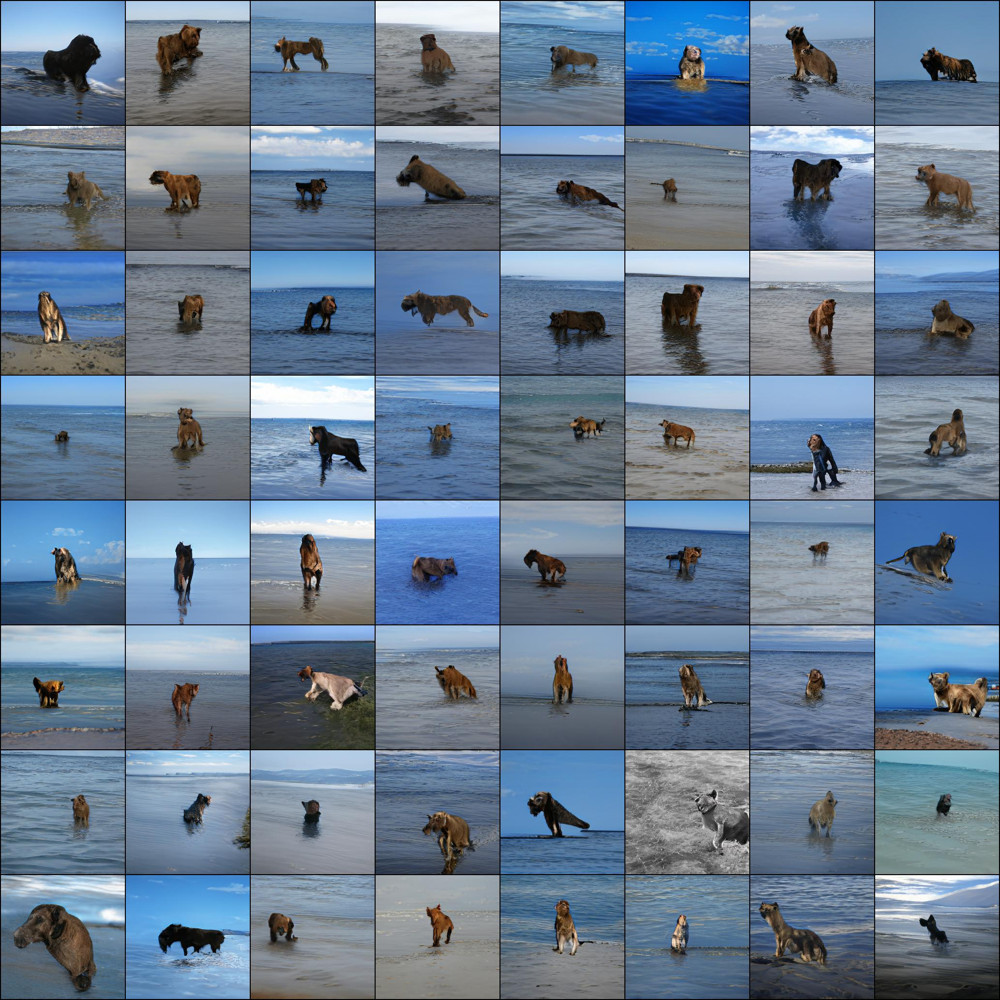

  181 |   11584 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
  182 |   11648 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
  183 |   11712 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.318
  184 |   11776 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3184
  185 |   11840 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3184
  186 |   11904 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3184
  187 |   11968 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3184
  188 |   12032 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3184
  189 |   12096 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3188
  190 |   12160 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3188
After 190 iterations...


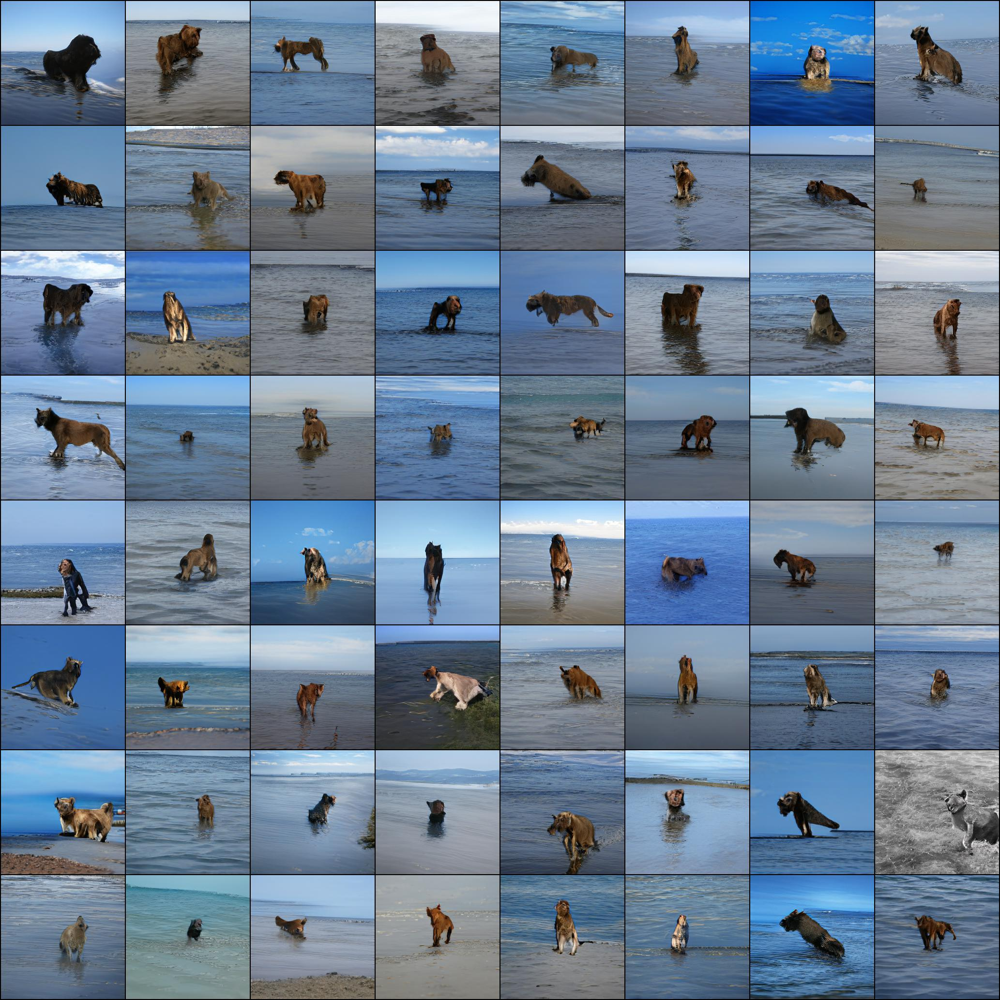

  191 |   12224 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  192 |   12288 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  193 |   12352 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  194 |   12416 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  195 |   12480 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  196 |   12544 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |       -0.319
  197 |   12608 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3193
  198 |   12672 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3193
  199 |   12736 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3196
  200 |   12800 |  0.00000E+00 |  0.00000E+00 |      -0.3445 |      -0.3196
After 200 iterations...


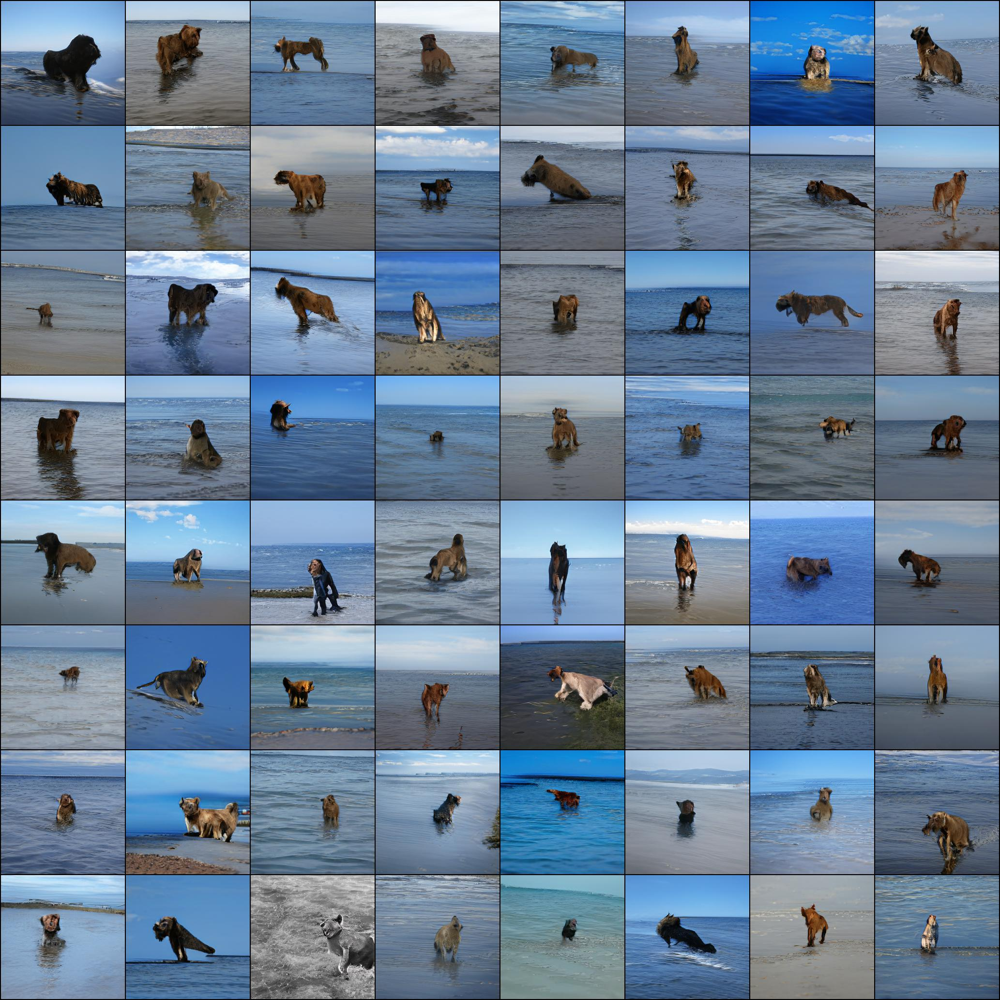

Final image for "a big lion in the ocean" target.


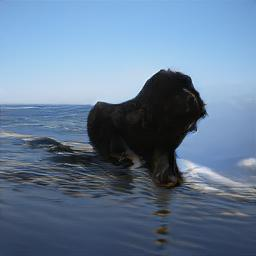

In [11]:
 #@title RUN (GENERATE IMAGES)

iteration=0
generate_image(0)